# Post Test set

In [6]:
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

In [7]:
import pandas as pd
df = pd.DataFrame()
df_2 = pd.DataFrame()

## Test Metrics

### Original volume

#### First Eigen Component percentage

In [8]:
from scripts.utils import *
orig_path = 'data/MOLLI_post_dataset/test'
orig_pca_changes = []
for file in sorted(glob.glob(os.path.join(orig_path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=1)
    orig_pca_changes.append(org_dis)
print(f"Mean of original PCA is {np.mean(np.array(orig_pca_changes))}")

Mean of original PCA is 0.8079221272634383


#### T1 fitting

In [9]:
import scipy.io
from pathlib import Path
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import ndimage

title_font_size=8
title_pad = 10
VMAX = 250

TVMAX = 2500

def mae(a, b):
    return np.absolute(np.subtract(a, b)).mean()


def plot_t1_changes(path, size=(20, 50)):
    fig = plt.figure(figsize=size)
    t1err_square_list = []
    t1err_heart_list = []
    t1err_myo_list = []
    subject_list = []
    sd_square_list = []
    sd_heart_list = []
    sd_myo_list = []
    avgt1s = []
    
    neighbor = ndimage.generate_binary_structure(2, 2)
    for i, file in enumerate(sorted(glob.glob(os.path.join(path, '*.mat')))):
        subject = Path(file).stem
        subject_list.append(subject)
        fd = scipy.io.loadmat(file)

        SD_err = np.real(fd['sd_mse'])

        epi = fd['epi_BW']
        endo = fd['endo_BW']

        heartmask = ndimage.binary_dilation(epi, structure=neighbor, iterations=1).astype(epi.dtype)

        itemindex = np.where(heartmask == 1)
        x1, x2 = max(itemindex[0][0]-20,0), min(itemindex[0][-1]+20, 111)
        y1, y2 = max(itemindex[1][0]-40,0), min(itemindex[1][-1]+40, 111)
        # print(subject, x1, x2, y1, y2)
        areamask = np.zeros_like(heartmask)
        areamask[x1:x2, y1:y2] = 1
        myomask = heartmask - endo
        
        errmap = SD_err * areamask
        square_SD_err = np.mean(errmap[areamask==1])
        t1err_square_list.append(square_SD_err)
        
        fig.add_subplot(20, 6, 1+i*6)
        ax = plt.gca()
        im = ax.imshow(errmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(square_SD_err):.4f}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        t1_params_pre = fd['pmap_mse']
        a = t1_params_pre[:, :, 0]
        b = t1_params_pre[:, :, 1]
        c = t1_params_pre[:, :, 2]
        t1map = c * (b - 1)
        t1map[t1map<0] = 0
        t1map[t1map>TVMAX] = TVMAX
        sd_square_list.append(t1map*areamask)

        fig.add_subplot(20, 6, 2+i*6)
        ax = plt.gca()
        im = ax.imshow(t1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        hearterrmap = SD_err * heartmask
        heartt1map = t1map * heartmask
        heart_SD_err = np.mean(hearterrmap[heartmask==1])
        t1err_heart_list.append(heart_SD_err)
        sd_heart_list.append(heartt1map)

        fig.add_subplot(20, 6, 3+i*6)
        ax = plt.gca()
        im = ax.imshow(hearterrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(heart_SD_err):.4f} in ROI", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 4+i*6)
        ax = plt.gca()
        im = ax.imshow(heartt1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        myoerrmap = SD_err * myomask
        myot1map = t1map * myomask
        myo_SD_err = np.mean(myoerrmap[myomask==1])
        sd_myo_list.append(myot1map)
        t1err_myo_list.append(myo_SD_err)
        avgt1 = np.mean(heartt1map[heartmask==1])
        avgt1s.append(avgt1)

        fig.add_subplot(20, 6, 5+i*6)
        ax = plt.gca()
        im = ax.imshow(myoerrmap, cmap='jet', vmin=0, vmax=VMAX)
        ax.axis('off')
        ax.set_title(f"Average SD error {(myo_SD_err):.4f} in Myocardium", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        fig.add_subplot(20, 6, 6+i*6)
        ax = plt.gca()
        im = ax.imshow(myot1map, cmap='jet', vmin=0, vmax=TVMAX)
        ax.axis('off')
        ax.set_title(f"{subject}", fontsize=title_font_size, pad=title_pad)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)
    plt.subplots_adjust(left=0.0001,right=0.9, top=0.95, bottom=0.1,)
    return fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s

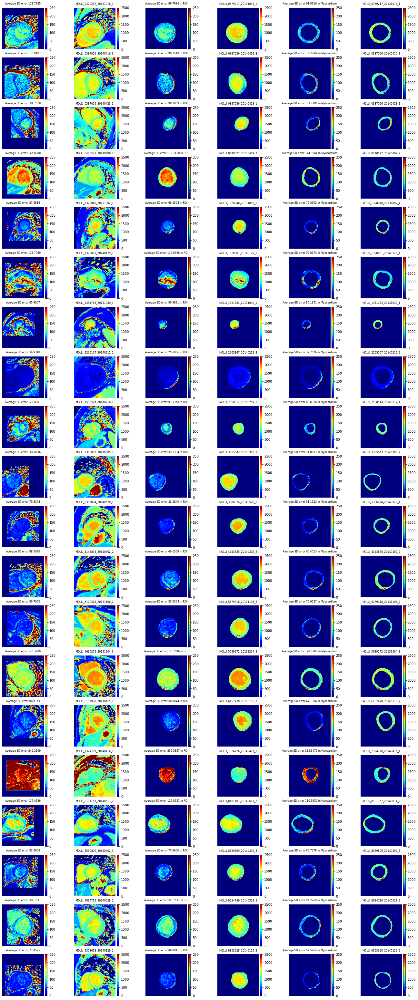

In [10]:
path = "data/MOLLI_pre_dataset/T1_SDerr"

fig, subject_list, orig_t1err_square_list, orig_t1err_heart_list, orig_t1err_myo_list, orig_sd_square_list, orig_sd_heart_list, orig_sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"data/MOLLI_pre_dataset/T1_SDerr/orig_t1err.png", dpi=300)

df['Cases'] = subject_list
df['Raw Square T1err'] = orig_t1err_square_list
df['Raw ROI T1err'] = orig_t1err_heart_list
df['Raw Myo T1err'] = orig_t1err_myo_list
df_2['Cases'] = subject_list
df_2['Raw PCA'] = orig_pca_changes

df['Raw ROI T1'] = avgt1s

### Round 1

In [11]:
import voxelmorph_group as vxm  # nopep8
import numpy as np
import glob
import os
jacobian = vxm.losses.Jacobian().loss

In [12]:
r = 1
root = f"results/MOLLI_pre/Group/rank_5_5_5_5_5_5_5/ncc/smooth/image_loss_weight1/cycle_loss_weight0.01/weight0.001/bspline/cps4_svfsteps7_svfscale1/e100/test_MOLLI_pre"
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [13]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 1 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 1 PCA is 0.9389210261966499 and std is 0.02804933809998582


#### Jacobian Determination

In [14]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0045206379145383835


#### T1 fitting

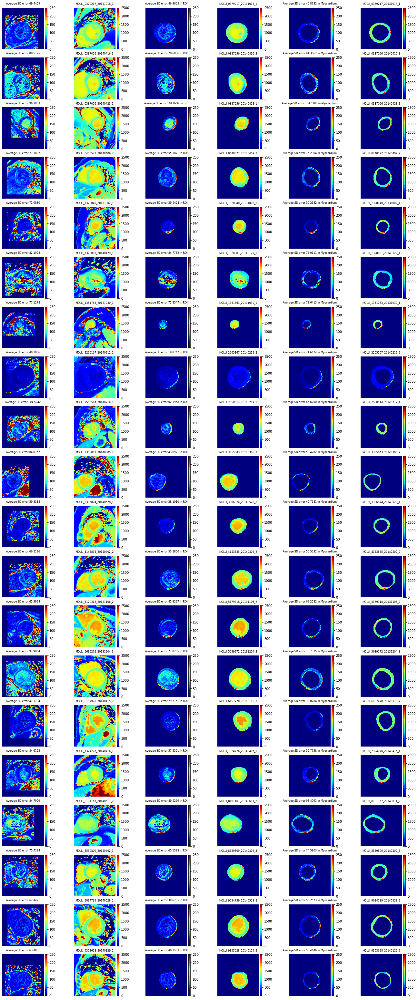

In [15]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 2

In [16]:
r = 2
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [17]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9424751273678277 and std is 0.025207396576703806


#### Jacobian Determination

In [18]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.004935312084853649


#### T1 fitting

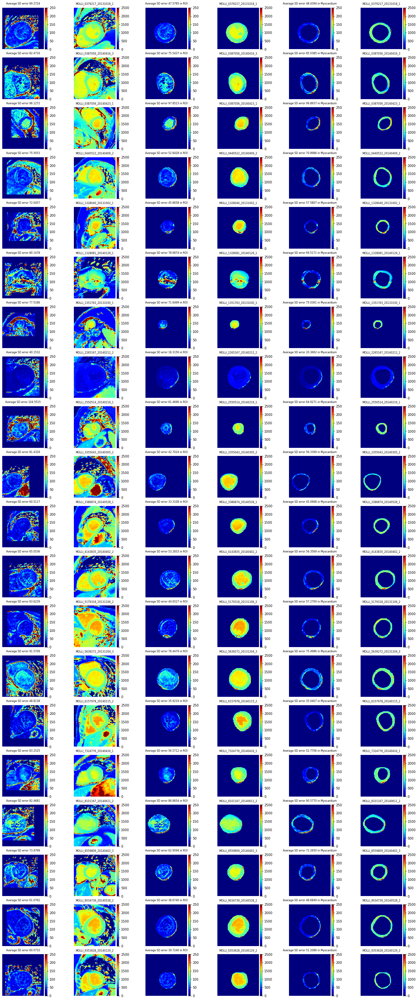

In [19]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 3

In [20]:
r = 3
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [21]:
path = f"{base_path}/moved"
r5_pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    r5_pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(r5_pca_changes))} and std is {np.std(np.array(r5_pca_changes))}")

Mean of Round 2 PCA is 0.9449548650039447 and std is 0.022381691120409282


#### Jacobian Determination

In [22]:
r5_folding_ratio_list = []
r5_mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    r5_folding_ratio_list.append(folding_ratio)
    r5_mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(r5_folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(r5_mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0057159531861543655


#### T1 fitting

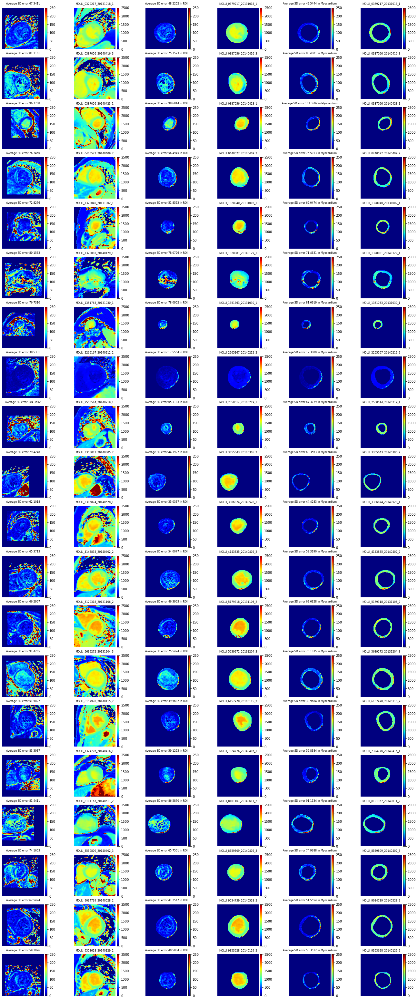

In [23]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 4

In [24]:
r = 4
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [25]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9456757283363203 and std is 0.022270664796182175


#### Jacobian Determination

In [26]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.006098927464336157


#### T1 fitting

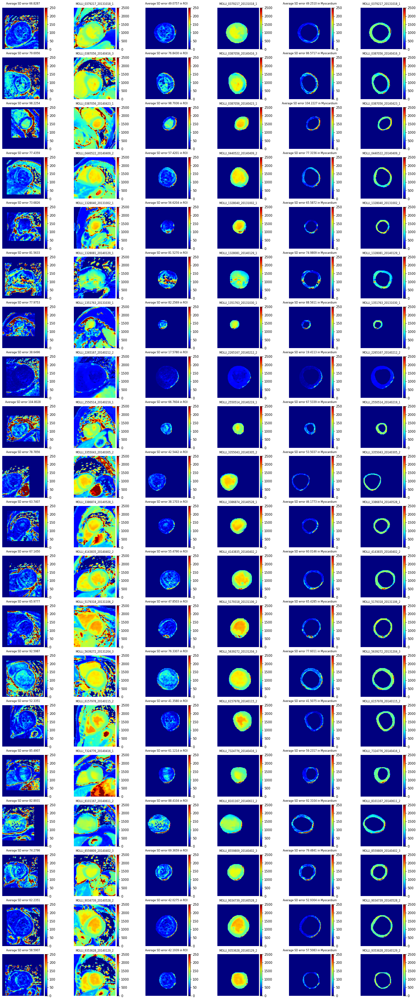

In [27]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 5

In [28]:
r = 5
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [29]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9465075643528917 and std is 0.020972078187650605


#### Jacobian Determination

In [30]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.0064958976581692696


#### T1 fitting

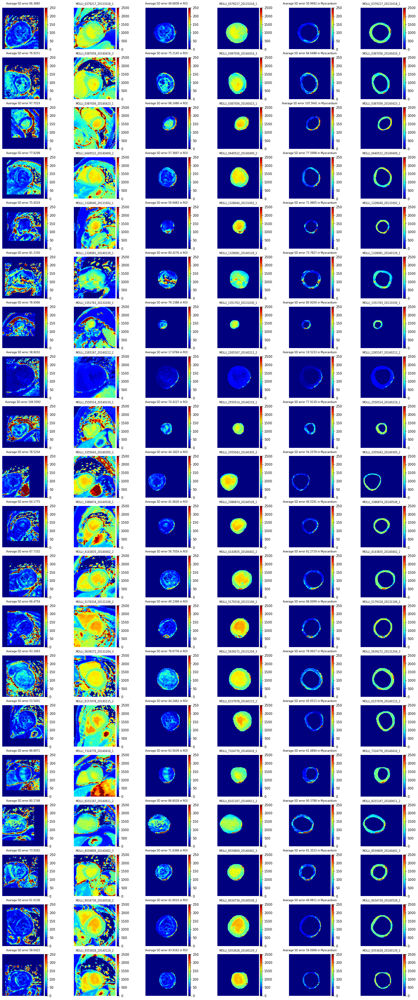

In [31]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 6

In [32]:
r = 6
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [33]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9470110500782825 and std is 0.020380802376080653


#### Jacobian Determination

In [34]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.006896055303514004


#### T1 fitting

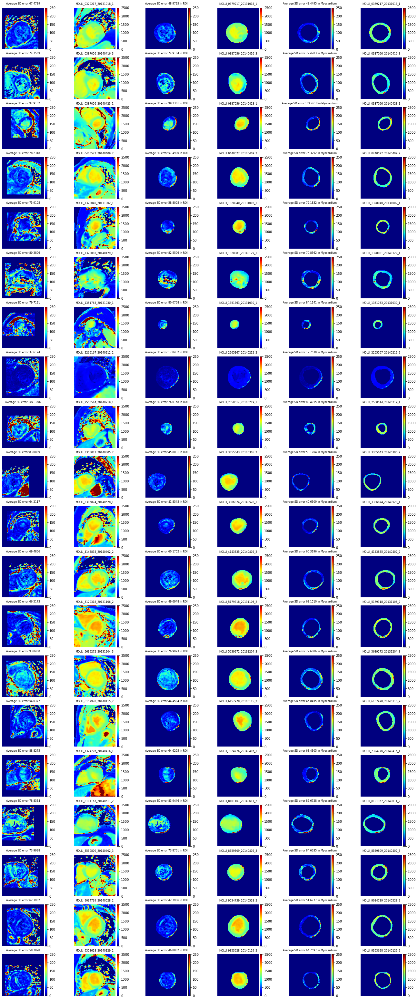

In [35]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Round 7

In [36]:
r = 7
base_path = f"{root}/round{r}"

#### First Eigen Component percentage

In [37]:
path = f"{base_path}/moved"
pca_changes = []
for file in sorted(glob.glob(os.path.join(path, '*.npy'))):
    vols = np.load(file).transpose(1, 2, 0)
    eig_org, org_K, org_dis = pca(vols, topk=2)
    pca_changes.append(org_dis)
print(f"Mean of Round 2 PCA is {np.mean(np.array(pca_changes))} and std is {np.std(np.array(pca_changes))}")

Mean of Round 2 PCA is 0.9472904646253946 and std is 0.019978353512049414


#### Jacobian Determination

In [38]:
folding_ratio_list = []
mag_det_jac_det_list = []
path = f"{base_path}/warp"
for file in sorted(glob.glob(os.path.join(path, '*.nii'))):
    disp = vxm.py.utils.load_volfile(file).transpose(2, 3, 0, 1)
    folding_ratio, mag_det_jac_det = jacobian(disp)
    folding_ratio_list.append(folding_ratio)
    mag_det_jac_det_list.append(mag_det_jac_det)

print(f"Mean of folding ratio is {np.mean(np.array(folding_ratio_list))}")
print(f"Mean of mag det jac det is {np.mean(np.array(mag_det_jac_det_list))}")

Mean of folding ratio is 0.0
Mean of mag det jac det is 0.00705321878194809


#### T1 fitting

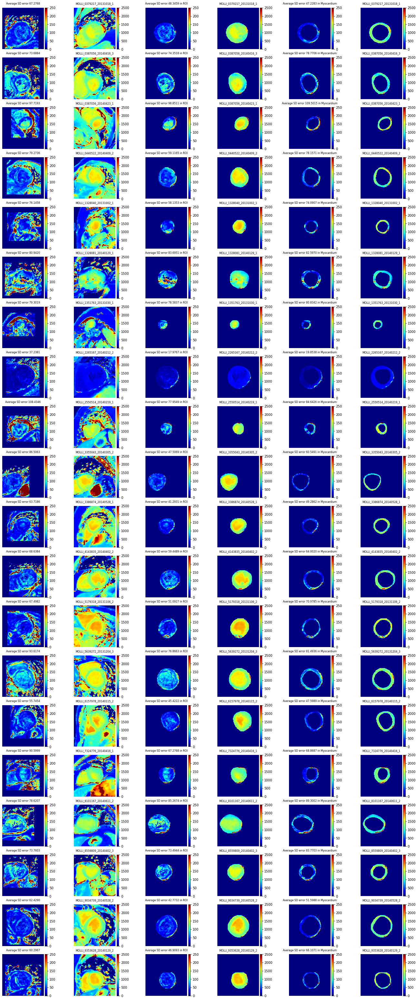

In [39]:
import matplotlib.pyplot as plt

path = f"{base_path}/T1_SDerr"

fig, subject_list, t1err_square_list, t1err_heart_list, t1err_myo_list, sd_square_list, sd_heart_list, sd_myo_list, avgt1s = plot_t1_changes(path)
plt.savefig(f"{base_path}/t1_SDerr.png", dpi=300)

df[f'R{r} Square T1err'] = t1err_square_list
df[f'R{r} ROI T1err'] = t1err_heart_list
df[f'R{r} Myo T1err'] = t1err_myo_list
df_2[f'R{r} PCA'] = pca_changes
df_2[f'R{r} Det'] = mag_det_jac_det_list

heart_maes = []
for idx, item in enumerate(orig_sd_heart_list):
    ite_mae = mae(item, sd_heart_list[idx])
    heart_maes.append(ite_mae)

myo_maes = []
for idx, item in enumerate(orig_sd_myo_list):
    ite_mae = mae(item, sd_myo_list[idx])
    myo_maes.append(ite_mae)

square_maes = []
for idx, item in enumerate(orig_sd_square_list):
    ite_mae = mae(item, sd_square_list[idx])
    square_maes.append(ite_mae)

df[f'R{r} Square T1 MAE'] = square_maes
df[f'R{r} ROI T1 MAE'] = heart_maes
df[f'R{r} Myo T1 MAE'] = myo_maes

df[f'R{r} ROI T1'] = avgt1s

### Summary

In [40]:
df

,Cases,Raw Square T1err,Raw ROI T1err,Raw Myo T1err,Raw ROI T1,R1 Square T1err,R1 ROI T1err,R1 Myo T1err,R1 Square T1 MAE,R1 ROI T1 MAE,...,R6 ROI T1 MAE,R6 Myo T1 MAE,R6 ROI T1,R7 Square T1err,R7 ROI T1err,R7 Myo T1err,R7 Square T1 MAE,R7 ROI T1 MAE,R7 Myo T1 MAE,R7 ROI T1
0,MOLLI_0379217_20131018_1,113.733521,99.793632,91.891601,1486.584593,69.445937,46.366471,45.873243,128.752667,28.457583,...,38.769889,15.166004,1346.695444,67.276789,48.345901,47.228290,210.811267,40.249260,16.032794,1350.812459
1,MOLLI_0387056_20140416_3,110.010744,90.751022,106.468876,1357.457246,88.512521,78.680607,91.366172,91.108961,11.958992,...,27.330947,18.973147,1283.483157,73.688439,74.351826,78.770608,193.374644,28.245078,19.142867,1283.722099
2,MOLLI_0387056_20140423_1,101.701804,98.295859,103.718442,1452.843230,96.300311,101.079398,104.528589,39.537442,6.241923,...,10.542194,7.249709,1502.455430,97.719258,98.851137,109.501495,74.721295,10.990104,7.486484,1498.664700
3,MOLLI_0440522_20140409_2,145.026017,172.740976,144.924077,1261.959705,77.303681,55.387083,76.290370,144.698060,33.057074,...,34.477031,14.757280,1437.761858,79.273561,59.116532,78.157131,173.322553,35.429295,15.452130,1452.957189
4,MOLLI_1328040_20131002_1,87.881633,66.259421,72.869187,1467.562622,71.087988,39.442354,52.258219,71.908068,5.324099,...,11.301600,6.156116,1514.009797,76.145777,58.135334,74.090675,128.886198,11.710494,6.324004,1512.618700
5,MOLLI_1328081_20140129_1,118.796867,114.679824,92.817428,1221.374051,82.192828,84.778216,75.011060,82.198300,16.420625,...,29.541774,10.958093,1153.984121,80.942022,83.695088,82.597007,179.552584,29.605858,11.263460,1165.043653
6,MOLLI_1351763_20131030_1,95.305737,90.369066,86.134118,1461.449777,77.127827,71.854704,73.641303,53.835054,4.222896,...,10.225995,7.168549,1255.024608,79.301893,78.583702,80.834161,87.871199,10.065529,6.930443,1243.385044
7,MOLLI_2265167_20140212_2,56.931752,25.696561,32.752590,287.951448,40.786584,19.074206,21.642390,57.208067,5.616114,...,10.092331,5.077269,279.349912,37.238101,17.976720,19.853768,89.527895,10.336413,5.167976,278.092469
8,MOLLI_2550514_20140219_1,122.820728,91.136828,89.691848,1318.226429,104.524155,62.396843,66.620007,72.833208,4.229330,...,10.013985,7.279498,1370.072597,108.434602,77.954927,84.642620,137.162428,11.369112,8.201200,1385.384878
9,MOLLI_3355043_20140305_2,107.079640,59.133438,71.009308,1448.488596,84.076743,43.097148,58.426228,68.613315,7.274007,...,17.060472,7.706067,1451.223977,86.506271,47.506870,60.549065,133.208761,18.891903,8.517636,1453.993034


In [41]:
df_ROI_desc = pd.DataFrame()
df_ROI_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_ROI_desc[f'R{round}/Raw ROI %'] = (df['Raw ROI T1err'] - df[f'R{round} ROI T1err']) / df['Raw ROI T1err']
df_ROI_desc.describe()

,R1/Raw ROI %,R2/Raw ROI %,R3/Raw ROI %,R4/Raw ROI %,R5/Raw ROI %,R6/Raw ROI %,R7/Raw ROI %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.324541,0.321416,0.297840,0.275760,0.258897,0.247076,0.243699
std,0.201915,0.195158,0.201018,0.211643,0.220805,0.228564,0.226274
min,-0.028318,0.004512,-0.003923,-0.005063,0.000481,-0.009565,-0.005649
25%,0.189990,0.196712,0.165865,0.129570,0.110082,0.102698,0.090232
50%,0.280880,0.285003,0.235026,0.220852,0.177297,0.170183,0.162672
75%,0.412663,0.352855,0.349786,0.345882,0.342311,0.358241,0.350616
max,0.756603,0.760681,0.749876,0.741431,0.731099,0.726591,0.715391


In [42]:
df_Myo_desc = pd.DataFrame()
df_Myo_desc['Cases'] = df['Cases']
for round in range(1, 8):
    df_Myo_desc[f'R{round}/Raw Myo %'] = (df['Raw Myo T1err'] - df[f'R{round} Myo T1err']) / df['Raw Myo T1err']
df_Myo_desc.describe()

,R1/Raw Myo %,R2/Raw Myo %,R3/Raw Myo %,R4/Raw Myo %,R5/Raw Myo %,R6/Raw Myo %,R7/Raw Myo %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.260913,0.271152,0.242216,0.219626,0.201662,0.181955,0.172439
std,0.190805,0.185155,0.194054,0.209382,0.218250,0.237647,0.237110
min,-0.016145,0.026368,-0.014371,-0.093409,-0.123041,-0.231280,-0.256899
25%,0.147861,0.146142,0.129181,0.097158,0.041930,0.008888,0.025194
50%,0.197423,0.226147,0.174152,0.175237,0.156204,0.121611,0.085822
75%,0.372812,0.386198,0.409192,0.397204,0.388196,0.382366,0.371022
max,0.775753,0.775775,0.758491,0.748322,0.738729,0.730481,0.707374


In [43]:
df_ROI_MAE = pd.DataFrame()
df_ROI_MAE['Cases'] = df['Cases']
rounds = 7
for round in range(1, rounds+1):
    df_ROI_MAE[f'R{round}'] = df[f"R{round} ROI T1 MAE"]
df_ROI_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,16.851851,18.538828,20.341564,21.597144,22.841254,23.619701,24.417365
std,13.626886,13.356338,13.049041,12.924697,12.786288,12.432322,12.440607
min,4.222896,4.550533,4.913685,6.127295,8.694965,10.013985,10.065529
25%,6.296689,8.674851,10.983000,12.119789,13.342871,13.889003,14.491297
50%,10.141642,12.082567,14.654187,15.699791,17.361411,18.759059,20.234604
75%,28.005110,29.840604,32.095245,32.931997,34.244356,33.835598,34.190162
max,48.370816,49.088380,49.500683,50.399188,52.224415,53.262061,54.176708


In [48]:
df[['Raw ROI T1', 'R3 ROI T1']]

,Raw ROI T1,R3 ROI T1
0,1486.584593,1341.258258
1,1357.457246,1324.903705
2,1452.843230,1503.659101
3,1261.959705,1438.615231
4,1467.562622,1491.546338
5,1221.374051,1138.458941
6,1461.449777,1369.446662
7,287.951448,284.976058
8,1318.226429,1366.550697
9,1448.488596,1456.021969


In [45]:
df_Myo_MAE = pd.DataFrame()
df_Myo_MAE['Cases'] = df['Cases']
for round in range(1, rounds+1):
    df_Myo_MAE[f'R{round}'] = df[f"R{round} Myo T1 MAE"]
df_Myo_MAE.describe()

,R1,R2,R3,R4,R5,R6,R7
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,7.285994,8.350813,9.232208,10.005103,10.879762,11.401082,11.907743
std,4.978241,5.091222,4.977102,4.915374,4.982410,4.800340,4.808006
min,2.903375,3.162411,3.401035,4.410362,4.753851,5.077269,5.167976
25%,3.514139,4.251132,5.117447,5.698795,6.477134,7.354187,8.169701
50%,5.544840,6.750072,8.147008,9.084855,9.763972,9.748297,10.180258
75%,10.002340,12.011150,13.019045,13.806358,14.810085,15.301371,16.110323
max,20.757620,20.590973,20.850794,20.772867,20.888828,20.280556,20.037370


In [46]:
df_PCA_desc = pd.DataFrame()
df_PCA_desc['Cases'] = df_2['Cases']
for round  in range(1, 8):
    df_PCA_desc[f'R{round}/Raw PCA %'] = (df_2[f'R{round} PCA'] - df_2['Raw PCA']) / df_2['Raw PCA']
df_PCA_desc.describe()

,R1/Raw PCA %,R2/Raw PCA %,R3/Raw PCA %,R4/Raw PCA %,R5/Raw PCA %,R6/Raw PCA %,R7/Raw PCA %
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.168503,0.173009,0.173009,0.177082,0.178169,0.178813,0.179170
std,0.092812,0.092871,0.092871,0.093138,0.093360,0.093394,0.093337
min,0.031358,0.041759,0.041759,0.051663,0.053168,0.054873,0.056142
25%,0.111303,0.115524,0.115524,0.115555,0.115793,0.115786,0.116036
50%,0.157529,0.161938,0.161938,0.165119,0.165796,0.166385,0.166864
75%,0.188846,0.191095,0.191095,0.199255,0.202338,0.203577,0.204534
max,0.435568,0.441863,0.441863,0.447411,0.448118,0.448426,0.447271


In [47]:
df_det = df_2[['R1 Det', 'R2 Det', 'R3 Det', 'R4 Det', 'R5 Det', 'R6 Det', 'R7 Det']]
df_det.describe()

,R1 Det,R2 Det,R3 Det,R4 Det,R5 Det,R6 Det,R7 Det
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,0.004521,0.004935,0.004935,0.006099,0.006496,0.006896,0.007053
std,0.000404,0.000351,0.000351,0.000377,0.000345,0.000360,0.000328
min,0.003781,0.004258,0.004258,0.005493,0.005907,0.006141,0.006311
25%,0.004230,0.004680,0.004680,0.005772,0.006286,0.006635,0.006933
50%,0.004522,0.004972,0.004972,0.006107,0.006511,0.007077,0.007059
75%,0.004817,0.005131,0.005131,0.006375,0.006711,0.007146,0.007249
max,0.005234,0.005704,0.005704,0.006730,0.007109,0.007335,0.007670
